In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import plotly.graph_objects as go
import plotly.express as px

In [2]:
#Additional libraries
import sys
from scipy import stats
from collections import defaultdict, Counter
from scipy import spatial
import datetime
import pylab as plt
import scipy.stats as ss
import statsmodels.api as sm
from scipy.stats.stats import pearsonr
import json
import random
import itertools
from sklearn.manifold import TSNE
from copy import deepcopy
import time
import scipy as sp
from scipy.sparse import csr_matrix
import matplotlib.cm as cm
import matplotlib
from numpy.random import choice
import itertools
import operator
from sklearn import manifold
import pandas as pd
import statsmodels.api as sm

In [3]:
#libraries for wordcloud
from wordcloud import WordCloud ,STOPWORDS, ImageColorGenerator
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud ,STOPWORDS, ImageColorGenerator

In [4]:
#Importing the dataframes
data=pd.read_csv(r'C:\Users\gouth\Desktop\Coursework\INFSCI 2415 Info Viz\DataSets\us_perm_visas.csv')
location=pd.read_csv(r'C:\Users\gouth\Desktop\Coursework\INFSCI 2415 Info Viz\DataSets\lat.csv')

C:\Users\gouth\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3058: DtypeWarning:

Columns (0,1,2,3,4,5,6,7,10,11,16,17,20,21,22,25,26,27,28,29,30,31,32,33,34,35,36,37,39,40,41,42,43,44,45,47,48,49,50,51,52,53,55,56,57,58,59,60,61,63,64,65,66,68,69,70,71,72,73,74,77,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,100,101,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,153) have mixed types. Specify dtype option on import or set low_memory=False.



In [5]:
data.head()

,add_these_pw_job_title_9089,agent_city,agent_firm_name,agent_state,application_type,case_no,case_number,case_received_date,case_status,class_of_admission,...,ri_pvt_employment_firm_to,ri_us_workers_considered,schd_a_sheepherder,us_economic_sector,wage_offer_from_9089,wage_offer_to_9089,wage_offer_unit_of_pay_9089,wage_offered_from_9089,wage_offered_to_9089,wage_offered_unit_of_pay_9089
0,NaN,NaN,NaN,NaN,PERM,A-07323-97014,NaN,NaN,Certified,J-1,...,NaN,NaN,NaN,IT,75629,NaN,yr,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,PERM,A-07332-99439,NaN,NaN,Denied,B-2,...,NaN,NaN,NaN,Other Economic Sector,37024,NaN,yr,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,PERM,A-07333-99643,NaN,NaN,Certified,H-1B,...,NaN,NaN,NaN,Aerospace,47923,NaN,yr,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,PERM,A-07339-01930,NaN,NaN,Certified,B-2,...,NaN,NaN,NaN,Other Economic Sector,10.97,NaN,hr,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,PERM,A-07345-03565,NaN,NaN,Certified,L-1,...,NaN,NaN,NaN,Advanced Mfg,100000,NaN,yr,NaN,NaN,NaN


In [6]:
data.isnull().sum()

add_these_pw_job_title_9089      332168
agent_city                       162908
agent_firm_name                  167365
agent_state                      166123
application_type                 239093
                                  ...  
wage_offer_to_9089               300728
wage_offer_unit_of_pay_9089      115916
wage_offered_from_9089           259715
wage_offered_to_9089             343347
wage_offered_unit_of_pay_9089    303663
Length: 154, dtype: int64

In [7]:
data.shape

(374362, 154)

In [8]:
location.head()

,city,city_ascii,state_id,state_name,county_fips,county_name,county_fips_all,county_name_all,lat,lng,population,density,source,military,incorporated,timezone,ranking,zips,id
0,South Creek,South Creek,WA,Washington,53053,Pierce,53053,Pierce,46.9994,-122.3921,2500,125.0,polygon,False,True,America/Los_Angeles,3,98580 98387 98338,1840042075
1,Roslyn,Roslyn,WA,Washington,53037,Kittitas,53037,Kittitas,47.2507,-121.0989,947,84.0,polygon,False,True,America/Los_Angeles,3,98941 98068 98925,1840019842
2,Sprague,Sprague,WA,Washington,53043,Lincoln,53043,Lincoln,47.3048,-117.9713,441,163.0,polygon,False,True,America/Los_Angeles,3,99032,1840021107
3,Gig Harbor,Gig Harbor,WA,Washington,53053,Pierce,53053,Pierce,47.3352,-122.5968,9507,622.0,polygon,False,True,America/Los_Angeles,3,98332 98335,1840019855
4,Lake Cassidy,Lake Cassidy,WA,Washington,53061,Snohomish,53061,Snohomish,48.0639,-122.0920,3591,131.0,polygon,False,True,America/Los_Angeles,3,98223 98258 98270,1840041959


In [9]:
location.isnull().sum()

city               0
city_ascii         0
state_id           0
state_name         0
county_fips        0
county_name        0
county_fips_all    0
county_name_all    0
lat                0
lng                0
population         0
density            0
source             0
military           0
incorporated       0
timezone           0
ranking            0
zips               1
id                 0
dtype: int64

In [10]:
location.shape

(28889, 19)

In [11]:
data.columns

Index(['add_these_pw_job_title_9089', 'agent_city', 'agent_firm_name',
       'agent_state', 'application_type', 'case_no', 'case_number',
       'case_received_date', 'case_status', 'class_of_admission',
       ...
       'ri_pvt_employment_firm_to', 'ri_us_workers_considered',
       'schd_a_sheepherder', 'us_economic_sector', 'wage_offer_from_9089',
       'wage_offer_to_9089', 'wage_offer_unit_of_pay_9089',
       'wage_offered_from_9089', 'wage_offered_to_9089',
       'wage_offered_unit_of_pay_9089'],
      dtype='object', length=154)

In [12]:
'''As there a lot of columns in US_PERM_VISAS(data). 
We deleted all the irrlevant columns for our project in excel and imported a new csv'''
df = pd.read_csv(r'C:\Users\gouth\Desktop\Coursework\INFSCI 2415 Info Viz\DataSets\map1.csv')


In [13]:
df.head()

,index,case_status,class_of_admission,country_of_citizenship,employer_city,employer_postal_code,employer_state,job_info_work_city,job_info_work_state
0,20577,Certified-Expired,EWI,ECUADOR,LONG ISLAND CITY,11101,NEW YORK,LONG ISLAND CITY,NEW YORK
1,20578,Certified,H-1B,INDIA,COPPELL,75019,TEXAS,Santa Clara,CALIFORNIA
2,20579,Certified,L-1,PHILIPPINES,COPPELL,75019,TEXAS,Coppell,TEXAS
3,20580,Certified-Expired,H-1B,INDIA,COPPELL,75019,TEXAS,Lawrenceville,GEORGIA
4,20581,Certified,H-1B,INDIA,SAN JOSE,95134,CALIFORNIA,San Jose,CALIFORNIA


In [14]:
df.shape

(332077, 9)

In [15]:
df.isnull().sum()

index                     0
case_status               0
class_of_admission        0
country_of_citizenship    0
employer_city             0
employer_postal_code      0
employer_state            0
job_info_work_city        0
job_info_work_state       0
dtype: int64

In [16]:
#Filtering only the H1B applicants data
df_H1B = df[(df['class_of_admission']=='H-1B')&(df['case_status']=='Certified')]
df_H1B=df_H1B.drop(['employer_postal_code','employer_city','employer_state'],axis=1)
df_H1B.head()

,index,case_status,class_of_admission,country_of_citizenship,job_info_work_city,job_info_work_state
1,20578,Certified,H-1B,INDIA,Santa Clara,CALIFORNIA
4,20581,Certified,H-1B,INDIA,San Jose,CALIFORNIA
5,20582,Certified,H-1B,INDIA,San Jose,CALIFORNIA
7,20584,Certified,H-1B,COLOMBIA,Irving,TEXAS
13,20594,Certified,H-1B,INDIA,Phoenix,ARIZONA


In [17]:
#To find the latitude and longitudes of home countries
from geopy.geocoders import Nominatim

In [18]:
geolocator = Nominatim()

C:\Users\gouth\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning:

Using Nominatim with the default "geopy/1.20.0" `user_agent` is strongly discouraged, as it violates Nominatim's ToS https://operations.osmfoundation.org/policies/nominatim/ and may possibly cause 403 and 429 HTTP errors. Please specify a custom `user_agent` with `Nominatim(user_agent="my-application")` or by overriding the default `user_agent`: `geopy.geocoders.options.default_user_agent = "my-application"`. In geopy 2.0 this will become an exception.



In [19]:
def geolocate(city=None, country=None):
    '''
    Inputs city and country, or just country. Returns the lat/long coordinates of 
    either the city if possible, if not, then returns lat/long of the center of the country.
    '''
    
    # If the city exists,
    if city != None:
        try:
            # To geolocate the city and country
            loc = geolocator.geocode(str(city + ',' + country))
            return (loc.latitude, loc.longitude)
        except:
            return np.nan
    # If the city doesn't exist
    else:
        try:
            loc = geolocator.geocode(country) 
            return (loc.latitude, loc.longitude)
        # Otherwise
        except:
            return np.nan

In [20]:
#Sample Test
geolocate(city='Austin', country='USA')

(30.2711286, -97.7436995)

In [21]:
#Obtaining the plotting latitudes and longitudes for home_countries
df_countries = df_H1B.groupby('country_of_citizenship').index.count().reset_index()
df_countries['latlong'] = df_countries.apply(lambda row: geolocate(country=row['country_of_citizenship']),axis=1)

In [22]:
df_countries.head()

,country_of_citizenship,index,latlong
0,AFGHANISTAN,4,"(33.7680065, 66.2385139)"
1,ALBANIA,37,"(41.000028, 19.9999619)"
2,ALGERIA,12,"(28.0000272, 2.9999825)"
3,ANGOLA,2,"(-11.8775768, 17.5691241)"
4,ANTIGUA AND BARBUDA,6,"(17.079128, -61.8222516)"


In [23]:
#Merging with our main dataframe
merged_H1B = pd.merge(left=df_H1B,right=df_countries, left_on='country_of_citizenship', right_on='country_of_citizenship')
merged_H1B.rename(columns={'latlong':'home_latlong'}, 
                 inplace=True)
merged_H1B.head()

,index_x,case_status,class_of_admission,country_of_citizenship,job_info_work_city,job_info_work_state,index_y,home_latlong
0,20578,Certified,H-1B,INDIA,Santa Clara,CALIFORNIA,85507,"(22.3511148, 78.6677428)"
1,20581,Certified,H-1B,INDIA,San Jose,CALIFORNIA,85507,"(22.3511148, 78.6677428)"
2,20582,Certified,H-1B,INDIA,San Jose,CALIFORNIA,85507,"(22.3511148, 78.6677428)"
3,20594,Certified,H-1B,INDIA,Phoenix,ARIZONA,85507,"(22.3511148, 78.6677428)"
4,20620,Certified,H-1B,INDIA,Farmington Hills,MICHIGAN,85507,"(22.3511148, 78.6677428)"


In [24]:
#Splitting the latitude and longitude
home_lat = []
home_lon = []
merged_H1B['home_latlong'] = merged_H1B['home_latlong'].astype('str')
for row in merged_H1B['home_latlong']:
    try:
        row = row[1:-1]
        home_lat.append(row.split(',')[0])
        home_lon.append(row.split(',')[1])
    except:    
        home_lat.append(np.NaN)
        home_lon.append(np.NaN)

In [25]:
merged_H1B['home_lat'] = home_lat
merged_H1B['home_lon'] = home_lon

In [26]:
merged_H1B.head()

,index_x,case_status,class_of_admission,country_of_citizenship,job_info_work_city,job_info_work_state,index_y,home_latlong,home_lat,home_lon
0,20578,Certified,H-1B,INDIA,Santa Clara,CALIFORNIA,85507,"(22.3511148, 78.6677428)",22.3511148,78.6677428
1,20581,Certified,H-1B,INDIA,San Jose,CALIFORNIA,85507,"(22.3511148, 78.6677428)",22.3511148,78.6677428
2,20582,Certified,H-1B,INDIA,San Jose,CALIFORNIA,85507,"(22.3511148, 78.6677428)",22.3511148,78.6677428
3,20594,Certified,H-1B,INDIA,Phoenix,ARIZONA,85507,"(22.3511148, 78.6677428)",22.3511148,78.6677428
4,20620,Certified,H-1B,INDIA,Farmington Hills,MICHIGAN,85507,"(22.3511148, 78.6677428)",22.3511148,78.6677428


In [27]:
location1=location[['city','state_id','lat','lng','state_name']].copy()
location1['state_name'] = location1['state_name'].str.upper()
location1.head()

,city,state_id,lat,lng,state_name
0,South Creek,WA,46.9994,-122.3921,WASHINGTON
1,Roslyn,WA,47.2507,-121.0989,WASHINGTON
2,Sprague,WA,47.3048,-117.9713,WASHINGTON
3,Gig Harbor,WA,47.3352,-122.5968,WASHINGTON
4,Lake Cassidy,WA,48.0639,-122.0920,WASHINGTON


In [28]:
merged_H1B_new = pd.merge(merged_H1B, location1,  how='inner', left_on=['job_info_work_city','job_info_work_state'], right_on = ['city','state_name'])
merged_H1B_new.head()

,index_x,case_status,class_of_admission,country_of_citizenship,job_info_work_city,job_info_work_state,index_y,home_latlong,home_lat,home_lon,city,state_id,lat,lng,state_name
0,20578,Certified,H-1B,INDIA,Santa Clara,CALIFORNIA,85507,"(22.3511148, 78.6677428)",22.3511148,78.6677428,Santa Clara,CA,37.3646,-121.968,CALIFORNIA
1,22755,Certified,H-1B,INDIA,Santa Clara,CALIFORNIA,85507,"(22.3511148, 78.6677428)",22.3511148,78.6677428,Santa Clara,CA,37.3646,-121.968,CALIFORNIA
2,22853,Certified,H-1B,INDIA,Santa Clara,CALIFORNIA,85507,"(22.3511148, 78.6677428)",22.3511148,78.6677428,Santa Clara,CA,37.3646,-121.968,CALIFORNIA
3,23738,Certified,H-1B,INDIA,Santa Clara,CALIFORNIA,85507,"(22.3511148, 78.6677428)",22.3511148,78.6677428,Santa Clara,CA,37.3646,-121.968,CALIFORNIA
4,24004,Certified,H-1B,INDIA,Santa Clara,CALIFORNIA,85507,"(22.3511148, 78.6677428)",22.3511148,78.6677428,Santa Clara,CA,37.3646,-121.968,CALIFORNIA


In [29]:
df_country_of_ctznsp = merged_H1B_new['country_of_citizenship'].value_counts().rename_axis('Country of Citizenship').reset_index(name='Head Count')[:26]

In [30]:
figure = px.bar(df_country_of_ctznsp, y="Country of Citizenship", x='Head Count', orientation='h', title = "Migrants from various countries to USA",color= "Country of Citizenship", color_continuous_scale=px.colors.qualitative.D3).update_yaxes(categoryorder="total ascending")
figure.show();

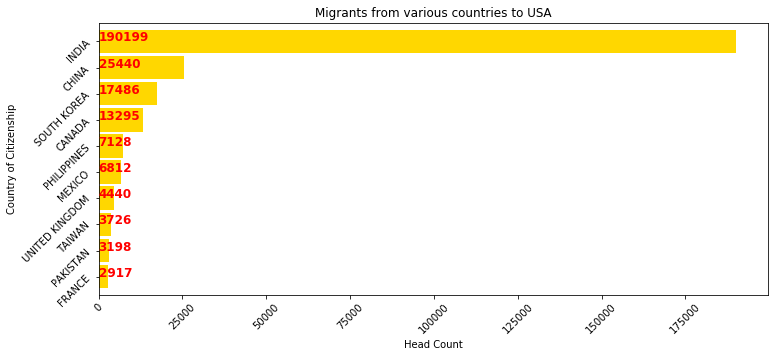

In [31]:
plt.figure(figsize=(12,5))
ax=df['country_of_citizenship'].value_counts().sort_values(ascending=False)[:10].plot.barh(width=0.9,color='#ffd700')
for i, v in enumerate(df['country_of_citizenship'].value_counts().sort_values(ascending=False).values[:10]): 
    ax.text(.8, i, v,fontsize=12,color='r',weight='bold')
plt.title('Migrants from various countries to USA')
plt.xlabel('Head Count')
plt.ylabel('Country of Citizenship')
plt.xticks(rotation=45)
plt.yticks(rotation=45)
fig=plt.gca()
fig.invert_yaxis()
plt.show()

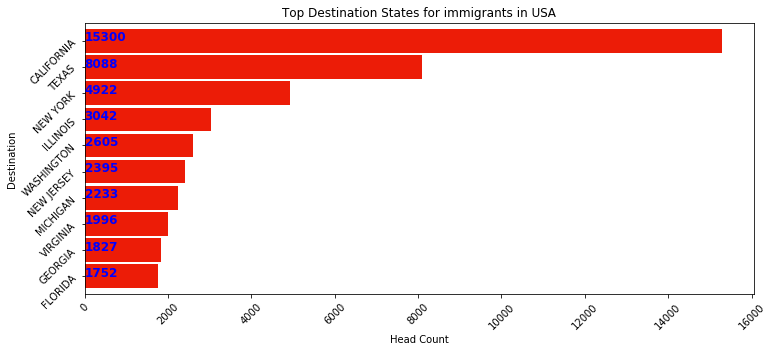

In [32]:
plt.figure(figsize=(12,5))
ax=merged_H1B_new['state_name'].value_counts().sort_values(ascending=False)[:10].plot.barh(width=0.9,color='#EC1C07')
for i, v in enumerate(merged_H1B_new['state_name'].value_counts().sort_values(ascending=False).values[:10]): 
    ax.text(.8, i, v,fontsize=12,color='b',weight='bold')
plt.title('Top Destination States for immigrants in USA')
plt.xlabel('Head Count')
plt.ylabel('Destination')
plt.xticks(rotation=45)
plt.yticks(rotation=45)
fig=plt.gca()
fig.invert_yaxis()
plt.show()

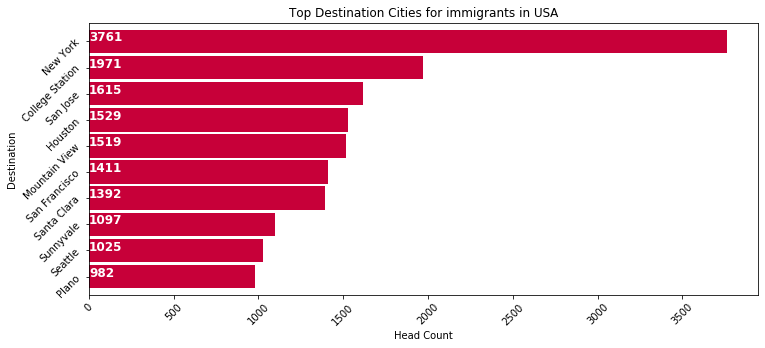

In [33]:
plt.figure(figsize=(12,5))
ax=merged_H1B_new['job_info_work_city'].value_counts().sort_values(ascending=False)[:10].plot.barh(width=0.9,color='#C70039')
for i, v in enumerate(merged_H1B_new['job_info_work_city'].value_counts().sort_values(ascending=False).values[:10]): 
    ax.text(.8, i, v,fontsize=12,color='w',weight='bold')
plt.title('Top Destination Cities for immigrants in USA')
plt.xlabel('Head Count')
plt.ylabel('Destination')
plt.xticks(rotation=45)
plt.yticks(rotation=45)
fig=plt.gca()
fig.invert_yaxis()
plt.show()

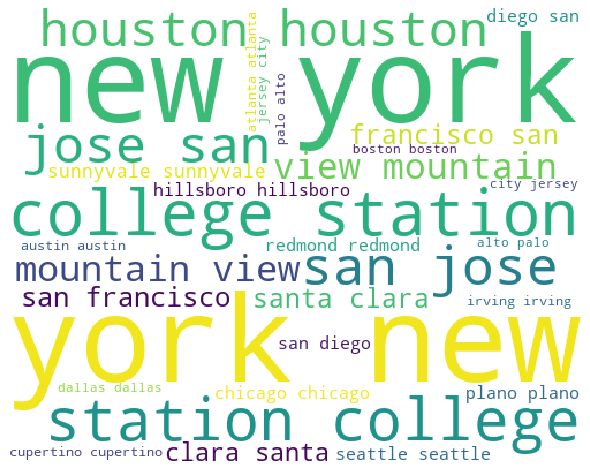

In [34]:
comment_words = ' '
stopwords = set(STOPWORDS) 
# iterate through the csv file 
for val in merged_H1B_new.job_info_work_city: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
          
    for words in tokens: 
        comment_words = comment_words + words + ' '
  
  
wordcloud = WordCloud(width = 500, height = 400, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

In [35]:
fig = go.Figure(data=go.Choropleth(
    locations=merged_H1B_new.state_id.unique(), # Spatial coordinates
    z = ["15300","913","2233","1364","1996","1827","1027","296","1752","3042","1190","2605","2395","8088","1459","639","554",
"4922","332","638","208","1149","96","345","349","131","380","542","336","309","145","242","174","1168","61","191","245",
"62","141","183","90","154","80","73","26","635",
"46",
"21",
"52",
"48",
"17",
"13"

], # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'reds',
    colorbar_title = "State-wise total Jobs",
))

fig.update_layout(
    title_text = 'Total Immigrants per state',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

In [36]:
'''
We have decided to go with R for the final visualization as we were getting better greatcircles curves
and overall appealing image comapred to Basemap function of python.
#For setting the data for the main plot,only narrowing to home country,destination in USA 
and the respective latitudes and longitudes.
Note: All the coordinates for a single state are not same, they depend on the job_info_work_city as well
'''
plot_df = merged_H1B_new[['country_of_citizenship','job_info_work_city','job_info_work_state','home_lat','home_lon','lat','lng']].copy()
plot_df.head()

,country_of_citizenship,job_info_work_city,job_info_work_state,home_lat,home_lon,lat,lng
0,INDIA,Santa Clara,CALIFORNIA,22.3511148,78.6677428,37.3646,-121.968
1,INDIA,Santa Clara,CALIFORNIA,22.3511148,78.6677428,37.3646,-121.968
2,INDIA,Santa Clara,CALIFORNIA,22.3511148,78.6677428,37.3646,-121.968
3,INDIA,Santa Clara,CALIFORNIA,22.3511148,78.6677428,37.3646,-121.968
4,INDIA,Santa Clara,CALIFORNIA,22.3511148,78.6677428,37.3646,-121.968


In [37]:
#Narrowing it to only 6 columns for main R plot
df_R = plot_df[['country_of_citizenship','job_info_work_city','home_lat','home_lon','lat','lng']].copy()
df_R.rename(columns = {'country_of_citizenship':'homecountry',
                      'job_info_work_city':'travellocation',
                      'home_lat':'homelat',
                      'home_lon':'homelon',
                      'lat':'travellat',
                      'lng':'travellon'}, inplace = True)
df_R.head()

,homecountry,travellocation,homelat,homelon,travellat,travellon
0,INDIA,Santa Clara,22.3511148,78.6677428,37.3646,-121.968
1,INDIA,Santa Clara,22.3511148,78.6677428,37.3646,-121.968
2,INDIA,Santa Clara,22.3511148,78.6677428,37.3646,-121.968
3,INDIA,Santa Clara,22.3511148,78.6677428,37.3646,-121.968
4,INDIA,Santa Clara,22.3511148,78.6677428,37.3646,-121.968


In [38]:
df_R.shape

(60284, 6)

In [39]:
df_R.describe()

,travellat,travellon
count,60284.000000,60284.000000
mean,37.914938,-96.859453
std,4.753299,18.877410
min,18.231900,-158.066500
25%,34.050700,-121.142200
50%,37.762500,-94.687000
75%,40.755650,-79.976300
max,64.835300,-65.659200


# Final R code for Visualization


In [40]:
'''install.packages("ggplot2")
install.packages("jpeg")
install.packages("gird")
install.packages("dplyr")
install.packages("magrittr")
install.packages("tidyverse")
install.packages("geosphere")
library(geosphere)
library(tidyverse)
library(magrittr)
library(ggplot2)
library(grid)
library(jpeg)
library(dplyr)


data <- read.table("C:\\Users\\gouth\\Desktop\\df_R.csv", header=T, sep=",")
#Download NASA night lights image
download.file("https://www.nasa.gov/specials/blackmarble/2016/globalmaps/BlackMarble_2016_01deg.jpg", 
              destfile = "C:\\Users\\gouth\\Desktop\\BlackMarble_2016_01deg.jpg", mode = "wb")
# Load picture and render
earth <- readJPEG("C:\\Users\\gouth\\Desktop\\BlackMarble_2016_01deg.jpg", native = TRUE)
earth <- rasterGrob(earth, interpolate = TRUE)

# Count how many times we have each unique connexion + order by importance
summary=data %>% dplyr::count(homelat,homelon,homecountry, travellat,travellon,travellocation) %>% arrange(n)

# A function that makes a dateframe per connection (we will use these connections to plot each lines)
data_for_connection=function( dep_lon, dep_lat, arr_lon, arr_lat, group){
  inter <- gcIntermediate(c(dep_lon, dep_lat), c(arr_lon, arr_lat), n=50, addStartEnd=TRUE, breakAtDateLine=F)             
  inter=data.frame(inter)
  inter$group=NA
  diff_of_lon=abs(dep_lon) + abs(arr_lon)
  if(diff_of_lon > 180){
    inter$group[ which(inter$lon>=0)]=paste(group, "A",sep="")
    inter$group[ which(inter$lon<0)]=paste(group, "B",sep="")
  }else{
    inter$group=group
  }
  return(inter)
}


# Create a complete dataframe with the points of all the lines to be done
data_ready_plot=data.frame()
for(i in c(1:nrow(summary))){
  tmp=data_for_connection(summary$homelon[i], summary$homelat[i], summary$travellon[i], summary$travellat[i] , i)
  tmp$homecountry=summary$homecountry[i]
  tmp$n=summary$n[i]
  data_ready_plot=rbind(data_ready_plot, tmp)
  print("----------------")
  print(i)
  print(nrow(data_ready_plot))
}
data_ready_plot$homecontinent=factor(data_ready_plot$homecountry)

# Plot
p <- ggplot() +
  annotation_custom(earth, xmin = -180, xmax = 180, ymin = -90, ymax = 90) +
  geom_line(data=data_ready_plot, aes(x=lon, y=lat, group=group, colour=homecountry, alpha=n), size=0.001) +
  #scale_color_brewer(palette="Set3") +
  theme_void() +
  theme(
    legend.position="none",
    panel.background = element_rect(fill = "black", colour = "black"), 
    panel.spacing=unit(c(0,0,0,0), "null"),
    plot.margin=grid::unit(c(0,0,0,0), "cm"),
  ) +
  xlim(-180,180) +
  ylim(-60,80) +
  scale_x_continuous(expand = c(0.006, 0.006)) +
  coord_equal() 

# Save at PNG
ggplot2::ggsave("C:\\Users\\gouth\\Desktop\\H1B.png", width = 36, height = 15.22, units = "in", dpi = 90)
'''

'install.packages("ggplot2")\ninstall.packages("jpeg")\ninstall.packages("gird")\ninstall.packages("dplyr")\ninstall.packages("magrittr")\ninstall.packages("tidyverse")\ninstall.packages("geosphere")\nlibrary(geosphere)\nlibrary(tidyverse)\nlibrary(magrittr)\nlibrary(ggplot2)\nlibrary(grid)\nlibrary(jpeg)\nlibrary(dplyr)\n\n\ndata <- read.table("C:\\Users\\gouth\\Desktop\\df_R.csv", header=T, sep=",")\n#Download NASA night lights image\ndownload.file("https://www.nasa.gov/specials/blackmarble/2016/globalmaps/BlackMarble_2016_01deg.jpg", \n              destfile = "C:\\Users\\gouth\\Desktop\\BlackMarble_2016_01deg.jpg", mode = "wb")\n# Load picture and render\nearth <- readJPEG("C:\\Users\\gouth\\Desktop\\BlackMarble_2016_01deg.jpg", native = TRUE)\nearth <- rasterGrob(earth, interpolate = TRUE)\n\n# Count how many times we have each unique connexion + order by importance\nsummary=data %>% dplyr::count(homelat,homelon,homecountry, travellat,travellon,travellocation) %>% arrange(n)\n\n# 

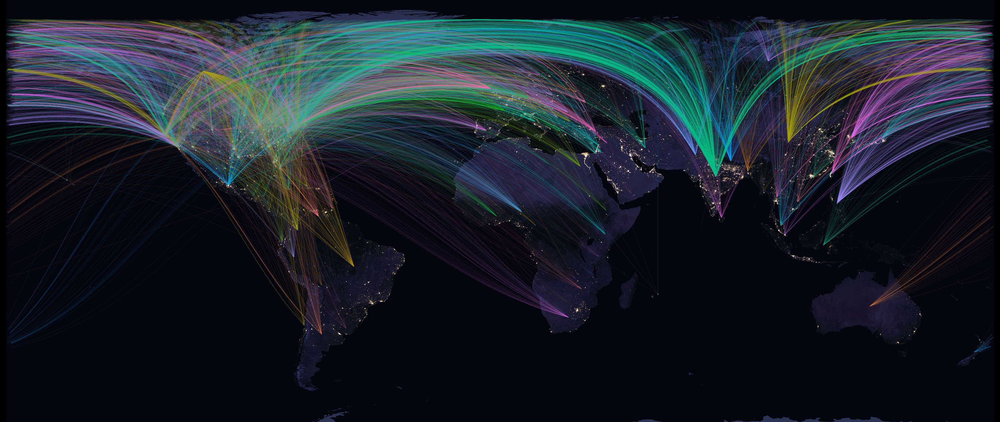